# Part 1: Binary Regularity Analysis

In [1]:
# Add directory above current directory to path
import sys; 
if not ".." in sys.path:
    sys.path.insert(0, '..')
    
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from scipy import stats

from utils.plot_utils import tsplot_periodogram

sns.set(style="darkgrid")

from utils.data_utils import *

%load_ext autoreload
%autoreload 2

#run this cell for fullscreen jupyter cells
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
def prepare_result(customer_data, result_data):
    """
    Concatenate customer base frame with entropy result frame for quick Seaborn plot building
    """
    
    dfs = [customer_data, result_data]
    
    return pd.concat(dfs, axis=1)

In [3]:
#set up data and result paths
customer_base_path = "../DATA_GYM/sanitized_customer_base.csv"
login_data_path = "../DATA_GYM/sanitized_login_data.csv"
result_folder = "../results/regularity/statistics/2020-05-29/"

In [4]:
login_data = load_login_data(login_data_path)
customer_data = load_customer_data(customer_base_path)

In [5]:
#convert the timedelta columns to floats
customer_data["CONTRACT_DURATION"] = customer_data.apply(lambda x: x.CONTRACT_DURATION / pd.Timedelta(days=1), axis=1)
customer_data["ACTIVE_DURATION"] = customer_data.apply(lambda x: x.ACTIVE_DURATION / pd.Timedelta(days=1), axis=1)
customer_data["VISITS_PER_DAY"] = customer_data.apply(lambda x: x.NUM_VISITS / x.CONTRACT_DURATION, axis=1)

In [6]:
time_binning = "1D"
mode = "cd"
name = "binary_regularity_results"
file_ext = ".csv"
binary_regularity_stats = load_result_data(result_folder + name + "_" + time_binning + "_" + mode + file_ext)

In [7]:
binreg_result = prepare_result(customer_data, binary_regularity_stats)
binreg_result.describe(percentiles=np.arange(1,10) * 0.1)

,CONTRACT_DURATION,ACTIVE_DURATION,NUM_VISITS,VISITS_PER_DAY,Binary_ApEn_m=2_r=0.2,Binary_ApEn_m=3_r=0.2,Binary_SampEn_m=2_r=0.2,Binary_SampEn_m=3_r=0.2,Binary_IntRepEn_n=3_lag=1,Binary_IntRepEn_n=5_lag=1,Binary_ShannonEntropy,Binary_ShannonMarkovEntropy
count,138563.000000,138563.000000,138563.000000,138563.000000,138519.000000,138519.000000,138519.000000,138519.000000,138519.000000,138519.000000,138519.000000,138519.000000
mean,611.660592,449.568978,63.952253,0.114485,0.385606,0.368455,0.259929,0.240405,0.404610,0.386344,0.423856,0.455091
std,551.323127,508.445904,99.670243,0.113991,0.252657,0.245745,0.236645,0.229494,0.258291,0.250265,0.265366,0.274816
min,30.000000,-19.506111,1.000000,0.000207,0.000003,0.000003,0.001197,0.001198,0.002125,0.001276,0.002835,0.001488
10%,95.293155,30.000000,4.000000,0.011717,0.070626,0.064754,0.031011,0.027287,0.080323,0.073369,0.089458,0.095442
20%,155.000000,69.000000,7.000000,0.024847,0.137753,0.127022,0.059559,0.051750,0.150950,0.140083,0.164379,0.177881
30%,231.331609,115.000000,12.000000,0.040114,0.206774,0.193623,0.093775,0.081492,0.221331,0.207966,0.236925,0.260876
40%,306.000000,176.000000,19.000000,0.058122,0.278038,0.261625,0.133152,0.115804,0.295720,0.279487,0.312375,0.345513
50%,425.000000,256.000000,28.000000,0.079296,0.351458,0.335472,0.181838,0.161251,0.371623,0.353201,0.390256,0.432547
60%,581.331609,375.000000,41.000000,0.105634,0.434798,0.414334,0.243390,0.217807,0.455323,0.435141,0.475503,0.525484


In [8]:
binreg_result.corr()

,ISACTIVE,CONTRACT_DURATION,ACTIVE_DURATION,NUM_VISITS,VISITS_PER_DAY,Binary_ApEn_m=2_r=0.2,Binary_ApEn_m=3_r=0.2,Binary_SampEn_m=2_r=0.2,Binary_SampEn_m=3_r=0.2,Binary_IntRepEn_n=3_lag=1,Binary_IntRepEn_n=5_lag=1,Binary_ShannonEntropy,Binary_ShannonMarkovEntropy
ISACTIVE,1.000000,0.378390,0.264010,0.236973,0.031790,0.034636,0.043460,0.030513,0.030687,0.027584,0.036106,0.021167,0.021079
CONTRACT_DURATION,0.378390,1.000000,0.869054,0.527056,-0.096648,-0.077063,-0.058219,-0.143324,-0.155861,-0.088481,-0.071935,-0.099995,-0.104786
ACTIVE_DURATION,0.264010,0.869054,1.000000,0.646870,0.092887,0.166236,0.186076,0.073123,0.057191,0.153344,0.172088,0.139189,0.146392
NUM_VISITS,0.236973,0.527056,0.646870,1.000000,0.542762,0.546572,0.560505,0.478937,0.446540,0.544584,0.557660,0.540074,0.523557
VISITS_PER_DAY,0.031790,-0.096648,0.092887,0.542762,1.000000,0.894142,0.881974,0.911026,0.886112,0.905980,0.897125,0.911975,0.881693
Binary_ApEn_m=2_r=0.2,0.034636,-0.077063,0.166236,0.546572,0.894142,1.000000,0.995003,0.946768,0.917265,0.995969,0.998234,0.984312,0.989356
Binary_ApEn_m=3_r=0.2,0.043460,-0.058219,0.186076,0.560505,0.881974,0.995003,1.000000,0.940417,0.918755,0.987875,0.996001,0.973703,0.981655
Binary_SampEn_m=2_r=0.2,0.030513,-0.143324,0.073123,0.478937,0.911026,0.946768,0.940417,1.000000,0.987522,0.940197,0.941641,0.927482,0.930973
Binary_SampEn_m=3_r=0.2,0.030687,-0.155861,0.057191,0.446540,0.886112,0.917265,0.918755,0.987522,1.000000,0.907737,0.913419,0.893484,0.899531
Binary_IntRepEn_n=3_lag=1,0.027584,-0.088481,0.153344,0.544584,0.905980,0.995969,0.987875,0.940197,0.907737,1.000000,0.997453,0.995607,0.994146


In [9]:
cd_normalizer = colors.LogNorm(vmin=binreg_result["CONTRACT_DURATION"].min(), vmax=binreg_result["CONTRACT_DURATION"].max())
nv_normalizer = colors.LogNorm(vmin=binreg_result["NUM_VISITS"].min(), vmax=binreg_result["NUM_VISITS"].max())
vpd_normalizer = colors.LogNorm(vmin=binreg_result["VISITS_PER_DAY"].min(), vmax=binreg_result["VISITS_PER_DAY"].max())

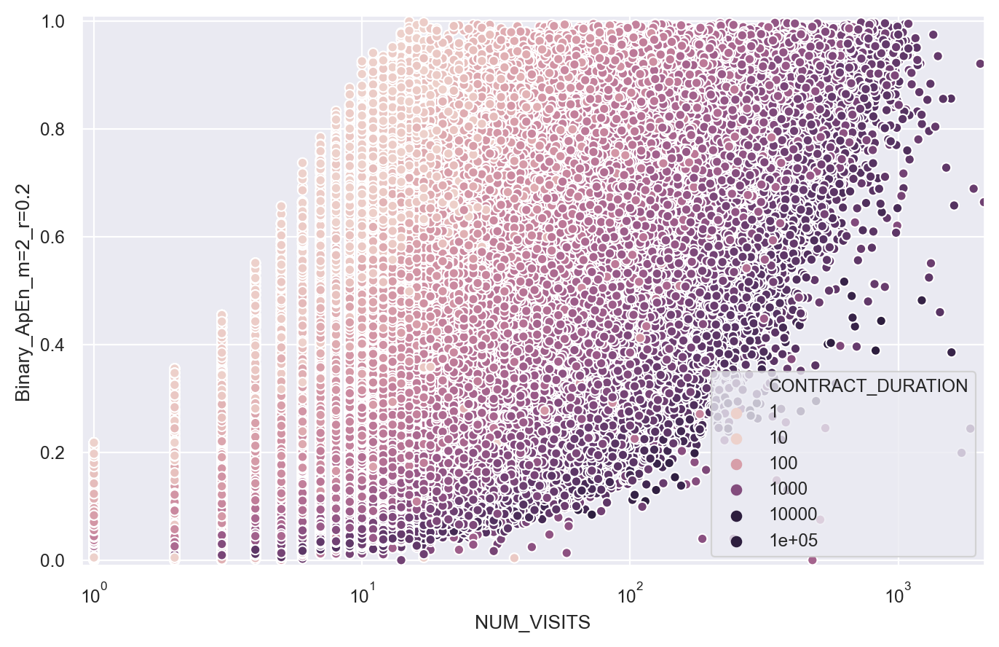

In [18]:
with sns.plotting_context("paper"):
    # Initialize figure and ax
    # Set up the matplotlib figure
    fig1, ax1 = plt.subplots(figsize=(8,5), dpi=200)

    # Set the scale of the x-and y-axes
    ax1.set(xscale="log", xlim=(0.9, 2100), ylim=(-0.01,1.01))
    sns.scatterplot(x="NUM_VISITS", y="Binary_ApEn_m=2_r=0.2", hue="CONTRACT_DURATION", hue_norm=cd_normalizer, data=binreg_result, ax=ax1, rasterized=True)

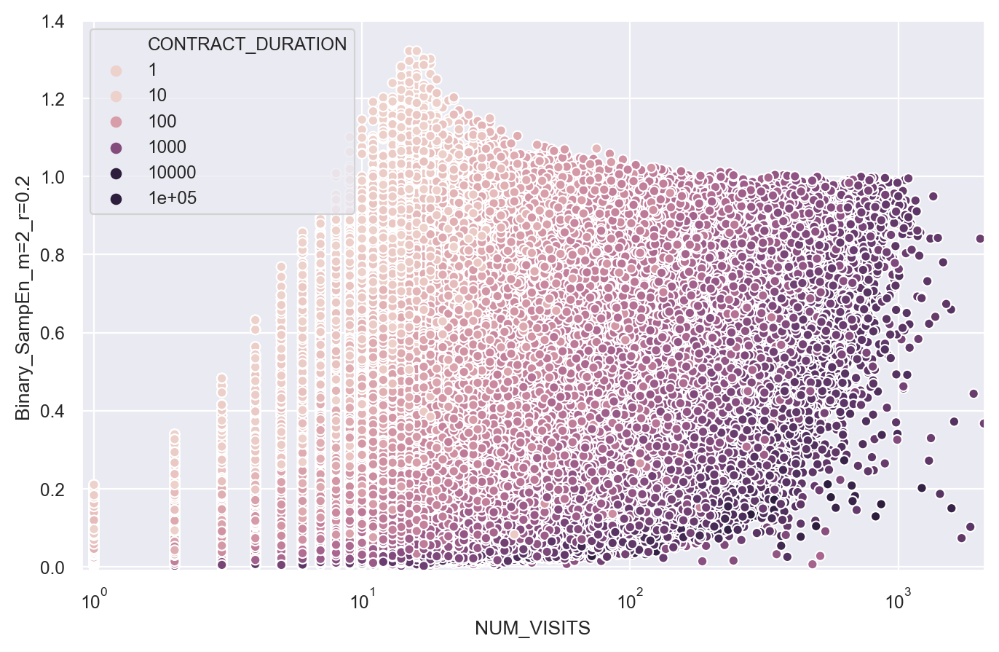

In [19]:
with sns.plotting_context("paper"):
    # Initialize figure and ax
    # Set up the matplotlib figure
    fig2, ax2 = plt.subplots(figsize=(8,5), dpi=200)

    # Set the scale of the x-and y-axes
    ax2.set(xscale="log", xlim=(0.9, 2100), ylim=(-0.01,1.4))
    sns.scatterplot(x="NUM_VISITS", y="Binary_SampEn_m=2_r=0.2", hue="CONTRACT_DURATION", hue_norm=cd_normalizer, data=binreg_result, ax=ax2, rasterized=True)

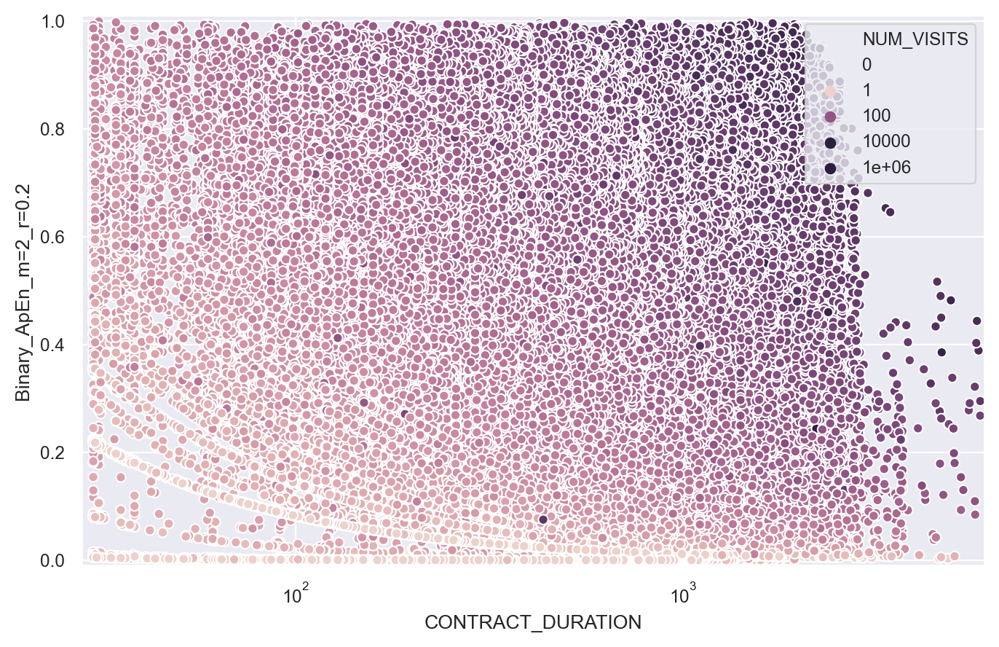

In [20]:
with sns.plotting_context("paper"):
    # Initialize figure and ax
    # Set up the matplotlib figure
    fig3, ax3 = plt.subplots(figsize=(8,5), dpi=200)

    # Set the scale of the x-and y-axes
    ax3.set(xscale="log", xlim=(28, 6000), ylim=(-0.01,1.01))
    sns.scatterplot(x="CONTRACT_DURATION", y="Binary_ApEn_m=2_r=0.2", hue="NUM_VISITS", hue_norm=nv_normalizer, data=binreg_result, ax=ax3, rasterized=True)

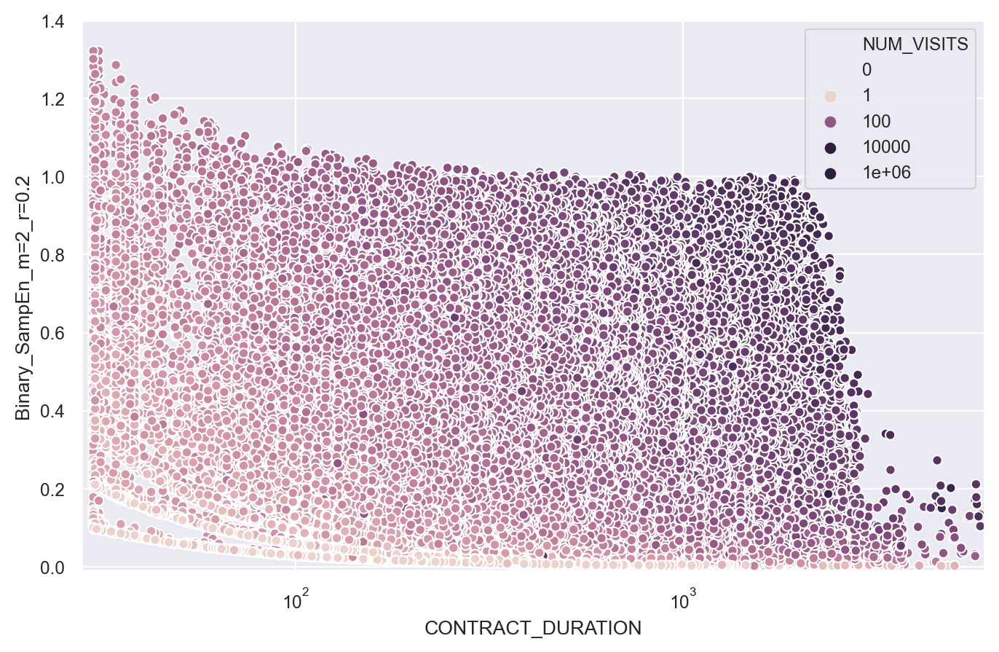

In [21]:
with sns.plotting_context("paper"):
    # Initialize figure and ax
    # Set up the matplotlib figure
    fig4, ax4 = plt.subplots(figsize=(8,5), dpi=200)

    # Set the scale of the x-and y-axes
    ax4.set(xscale="log", xlim=(28, 6000), ylim=(-0.01,1.4))
    sns.scatterplot(x="CONTRACT_DURATION", y="Binary_SampEn_m=2_r=0.2", hue="NUM_VISITS", hue_norm=nv_normalizer, data=binreg_result, ax=ax4, rasterized=True)

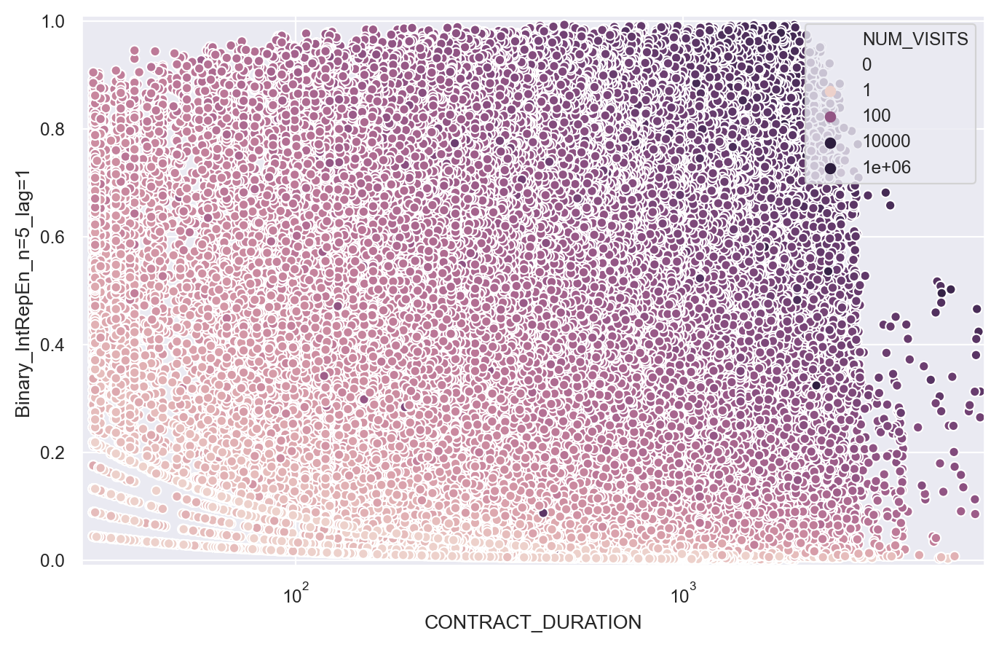

In [22]:
with sns.plotting_context("paper"):
    # Initialize figure and ax
    # Set up the matplotlib figure
    fig5, ax5 = plt.subplots(figsize=(8,5), dpi=200)

    # Set the scale of the x-and y-axes
    ax5.set(xscale="log", xlim=(28, 6000), ylim=(-0.01,1.01))
    sns.scatterplot(x="CONTRACT_DURATION", y="Binary_IntRepEn_n=5_lag=1", hue="NUM_VISITS", hue_norm=nv_normalizer, data=binreg_result, ax=ax5, rasterized=True)

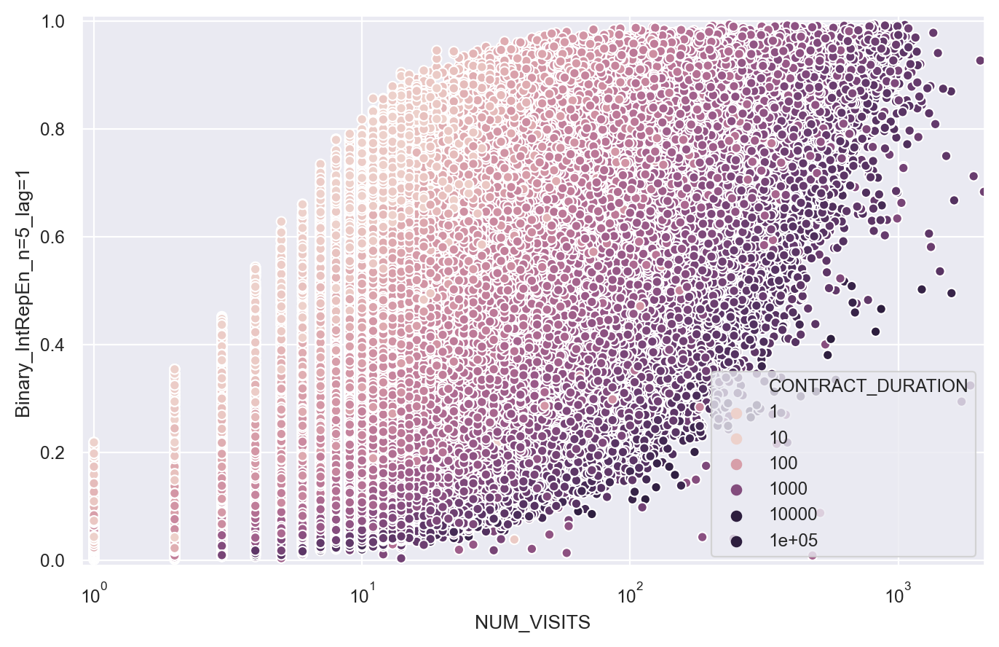

In [23]:
with sns.plotting_context("paper"):
    # Initialize figure and ax
    # Set up the matplotlib figure
    fig6, ax6 = plt.subplots(figsize=(8,5), dpi=200)

    # Set the scale of the x-and y-axes
    ax6.set(xscale="log", xlim=(0.9, 2100), ylim=(-0.01,1.01))
    sns.scatterplot(x="NUM_VISITS", y="Binary_IntRepEn_n=5_lag=1", hue="CONTRACT_DURATION", hue_norm=cd_normalizer, data=binreg_result, ax=ax6, rasterized=True)

In [24]:
fig1.savefig("../plots/result_plots/binary_apen_nv.pdf", format='pdf', bbox_inches='tight')
fig2.savefig("../plots/result_plots/binary_sampen_nv.pdf", format='pdf', bbox_inches='tight')
fig3.savefig("../plots/result_plots/binary_apen_cd.pdf", format='pdf', bbox_inches='tight')
fig4.savefig("../plots/result_plots/binary_sampen_cd.pdf", format='pdf', bbox_inches='tight')
fig5.savefig("../plots/result_plots/binary_intrepen_cd.pdf", format='pdf', bbox_inches='tight')
fig6.savefig("../plots/result_plots/binary_intrepen_nv.pdf", format='pdf', bbox_inches='tight')

In [85]:
stat_name = "Binary_SampEn_m=2_r=0.2"
n = 10000
sample = binreg_result.nsmallest(n, stat_name).sample(1)
sample_code = sample.index[0]
print(sample[stat_name])
print(sample_code)

7001851.70    0.023234
Name: Binary_SampEn_m=2_r=0.2, dtype: float64
7001851.70


In [86]:
fs = 4.0
classical_config = {"fs": fs, "window": "hann", "window_size": 7*4, "detrend": "constant", "scaling": "density", "mode": "none"}
welch_config = {"fs": fs, "window": "hann", "nperseg": 512, "noverlap": None, "nfft": 1024, "detrend": "constant", "scaling": "density"}

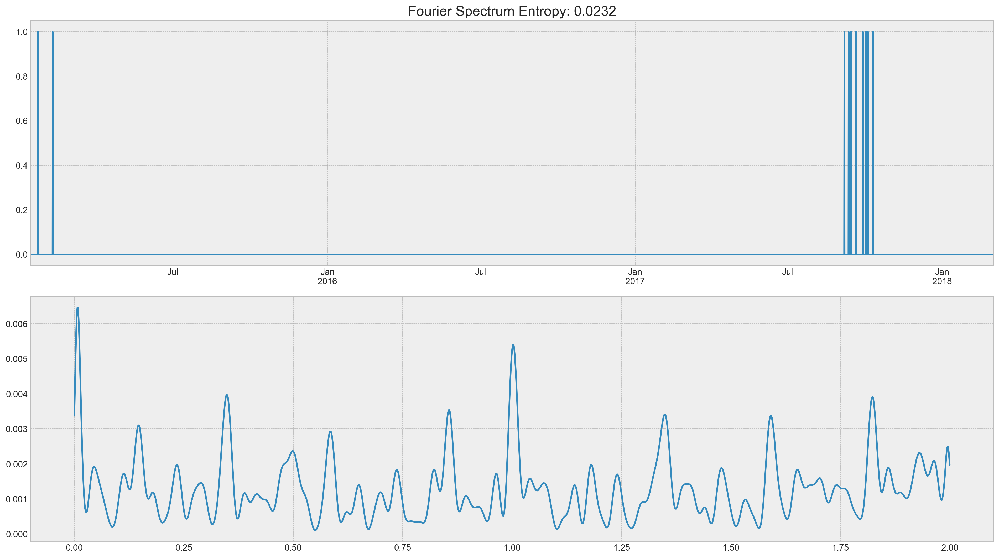

In [87]:
tsplot_periodogram(sample_code, binreg_result, login_data, stat_name, freq="6H", p_type="classical", **classical_config)